In [1]:
#Importando as bibliotecas
import numpy as np
import tifffile as tif
import rasterio as rio
import glob
import matplotlib.pyplot as plt
from spectral import imshow

In [2]:
import matplotlib
matplotlib.rcParams['figure.figsize']=(20,16)

In [3]:
## Le as bandas como numpyarray sem onerar a memória.(boa prática)
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B02_20m.jp2') as src1:
    b02 = src1.read()
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B03_20m.jp2') as src2:
    b03 = src2.read()
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B04_20m.jp2') as src3:
    b04 = src3.read()
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B05_20m.jp2') as src4:
    b05 = src4.read()
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B06_20m.jp2') as src5:
    b06 = src5.read()
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B07_20m.jp2') as src6:
    b07 = src6.read()
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B8A_20m.jp2') as src7:
    b8A = src7.read()
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B11_20m.jp2') as src8:
    b11 = src8.read()
with rio.open('dados/sentinel/R20m/T23KQS_20210915T130251_B12_20m.jp2') as src9:
    b12 = src9.read()

In [4]:
# Define função para reorganiza a ordem do shape da imagem.
def swap_rio(img):
    img = img.swapaxes(0,2)
    img = img.swapaxes(0,1)
    return img

In [5]:
#Aplicando função nas bandas. 
b02 =swap_rio(b02)
b03 =swap_rio(b03)
b04 =swap_rio(b04)
b05 =swap_rio(b05)
b06 =swap_rio(b06)
b07 =swap_rio(b07)
b8A =swap_rio(b8A)
b11 =swap_rio(b11)
b12 =swap_rio(b12)

In [6]:
#Gerando os indices de vegetação savi, ndvi, arvi, evi, spri, co2flux .
np.seterr(divide='ignore', invalid='ignore')# Permite a divisão por zero.

ndvi = (b8A.astype(float) - b04.astype(float))/(b8A + b04)

savi = ((b8A.astype(float) - b04.astype(float))/(b8A + b04 + 0.5))*(1 + 0.5)

arvi = (b8A.astype(float) - (2*b04 - b02))/(b8A + (2*b04 - b02))

evi = 2.5*(b8A.astype(float) - b04.astype(float))/(b8A+6*b04-7.5*b02+1)

spri = ((b02.astype(float) - b03.astype(float))/(b02 + b03) + 1)/2

co2flux = (ndvi * spri)

ImageView object:
  Display bands       :  [0]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.3155378486055777, 1.151402858655373]
    G: [0.3155378486055777, 1.151402858655373]
    B: [0.3155378486055777, 1.151402858655373]

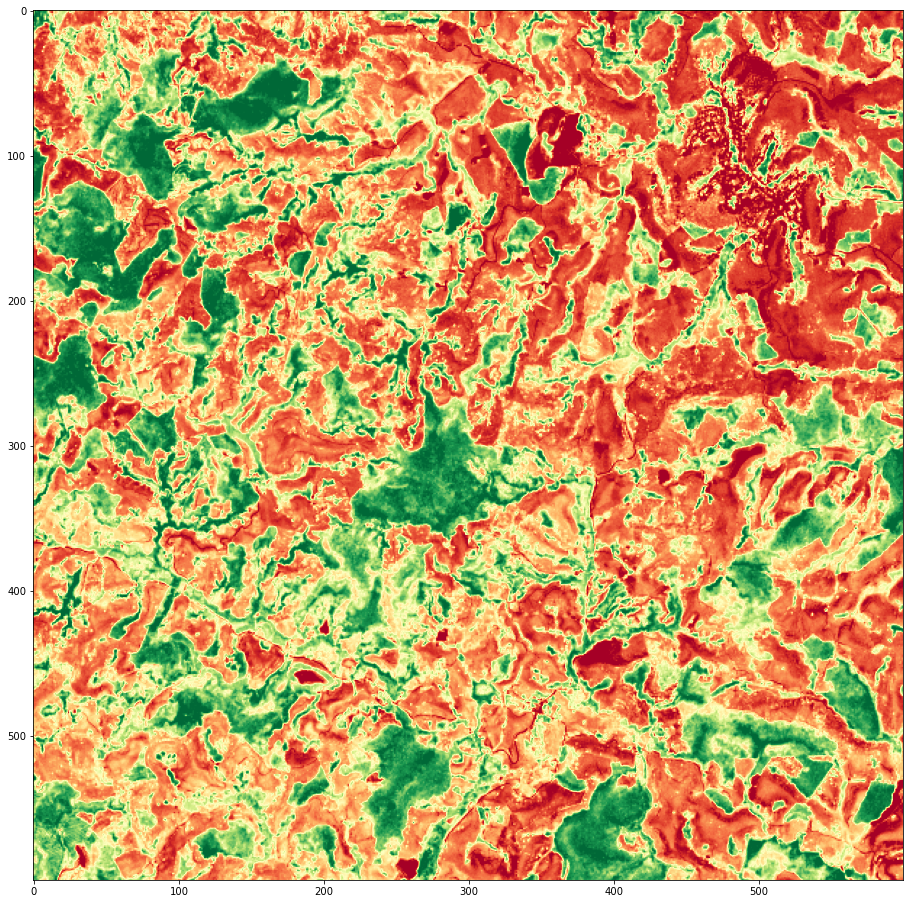

In [16]:
#Plotando savi com histograma expandido.
imshow(savi[4000:4600,2600:3200], stretch=(0.02,0.98), cmap='RdYlGn')

ImageView object:
  Display bands       :  [0]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.2103825136612022, 0.7677125506072875]
    G: [0.2103825136612022, 0.7677125506072875]
    B: [0.2103825136612022, 0.7677125506072875]

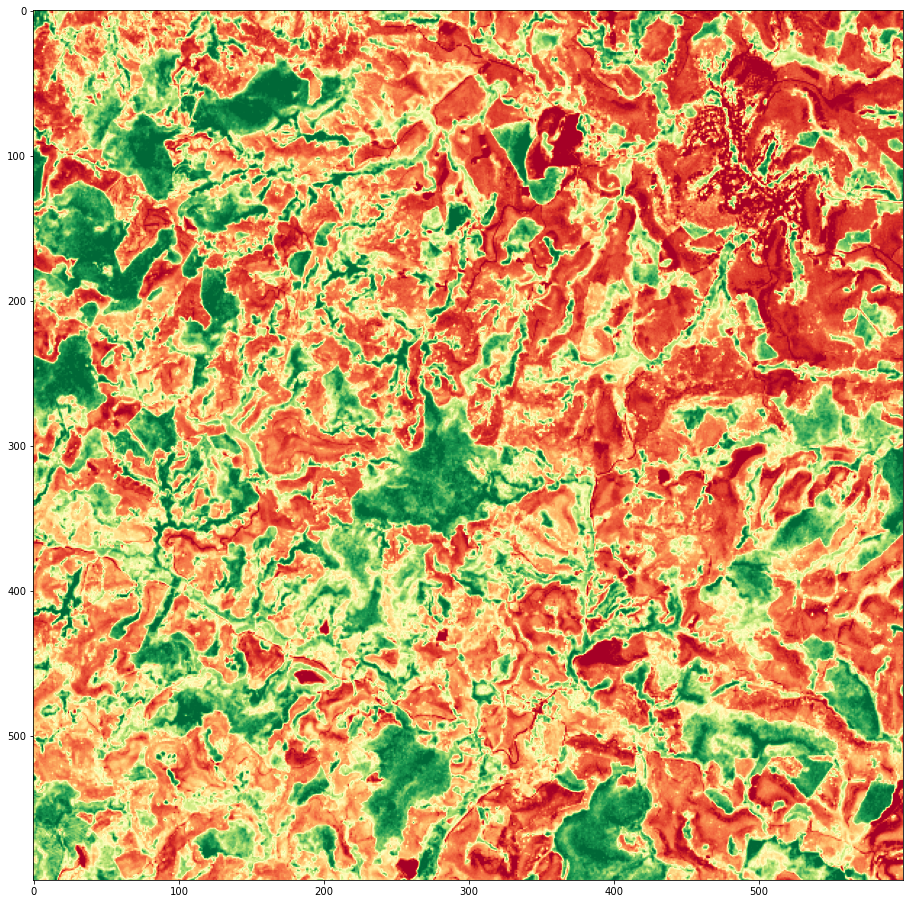

In [8]:
#Plotando ndvi com histograma expandido.
imshow(ndvi[4000:4600,2600:3200], stretch=(0.02,0.98), cmap='RdYlGn')

ImageView object:
  Display bands       :  [0]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.01726121979286536, 0.7638968481375358]
    G: [0.01726121979286536, 0.7638968481375358]
    B: [0.01726121979286536, 0.7638968481375358]

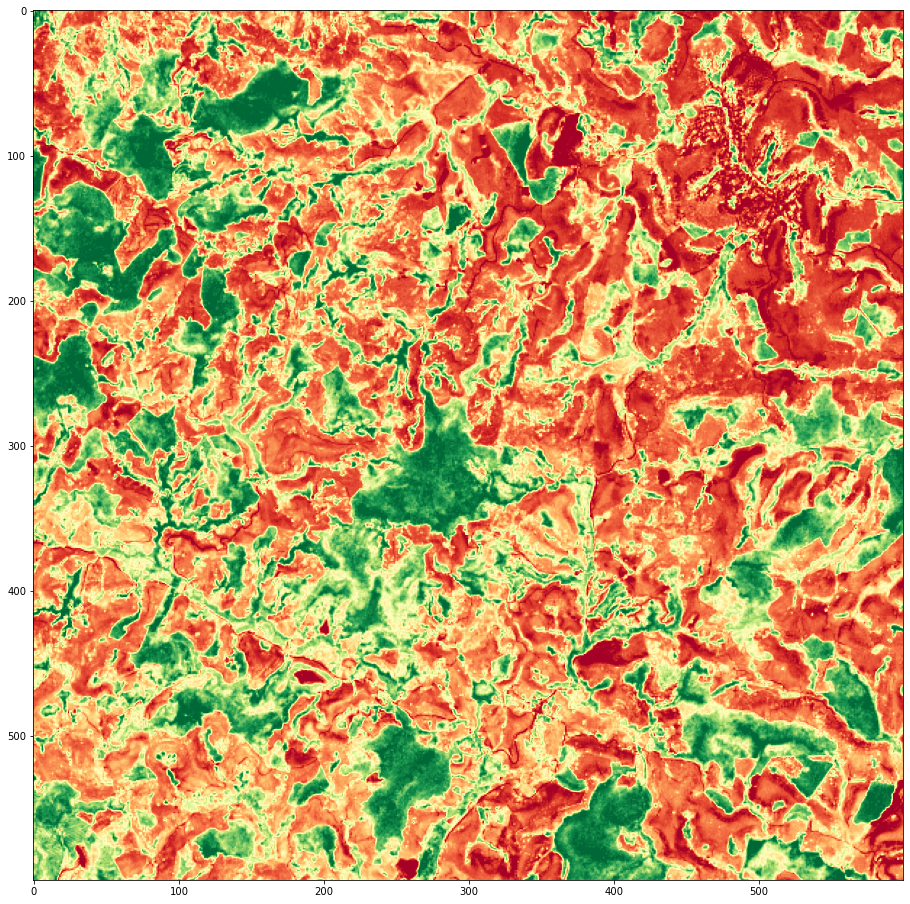

In [9]:
#Plotando arvi com histograma expandido.
imshow(arvi[4000:4600,2600:3200], stretch=(0.02,0.98), cmap='RdYlGn')

ImageView object:
  Display bands       :  [0]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.36470871449205583, 2.8084815321477428]
    G: [0.36470871449205583, 2.8084815321477428]
    B: [0.36470871449205583, 2.8084815321477428]

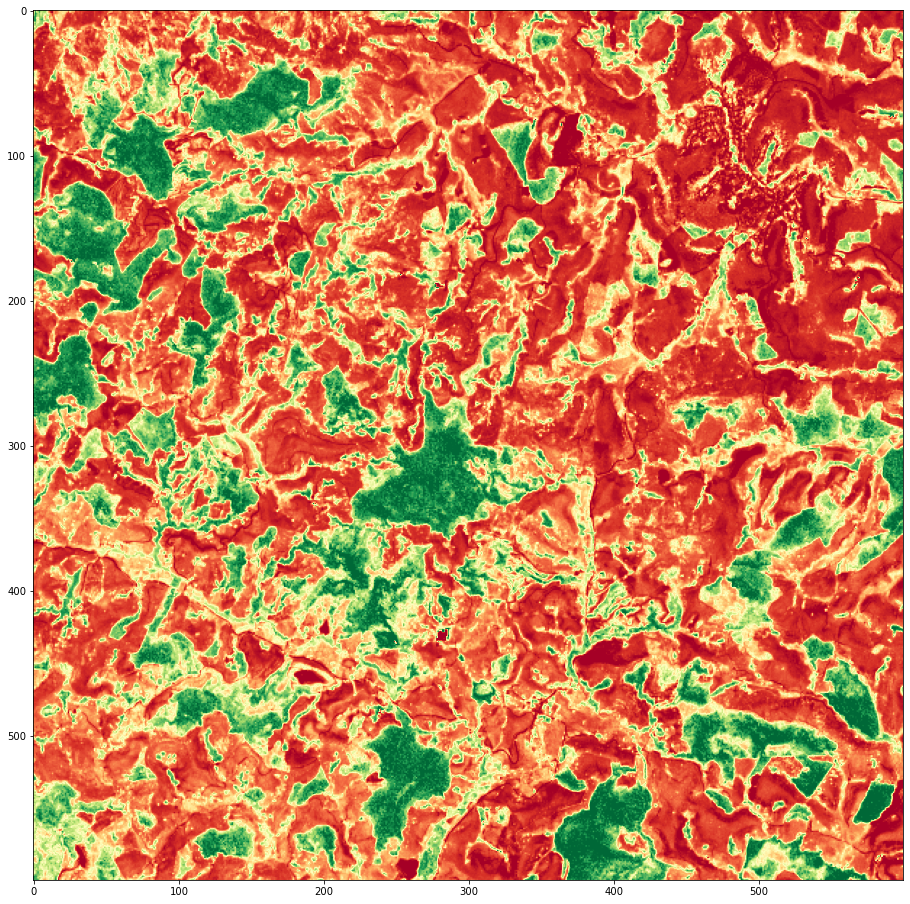

In [10]:
#Plotando evi com histograma expandido.
imshow(evi[4000:4600,2600:3200], stretch=(0.02,0.98), cmap='RdYlGn')

ImageView object:
  Display bands       :  [0]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.39152542372881355, 0.4492146596858639]
    G: [0.39152542372881355, 0.4492146596858639]
    B: [0.39152542372881355, 0.4492146596858639]

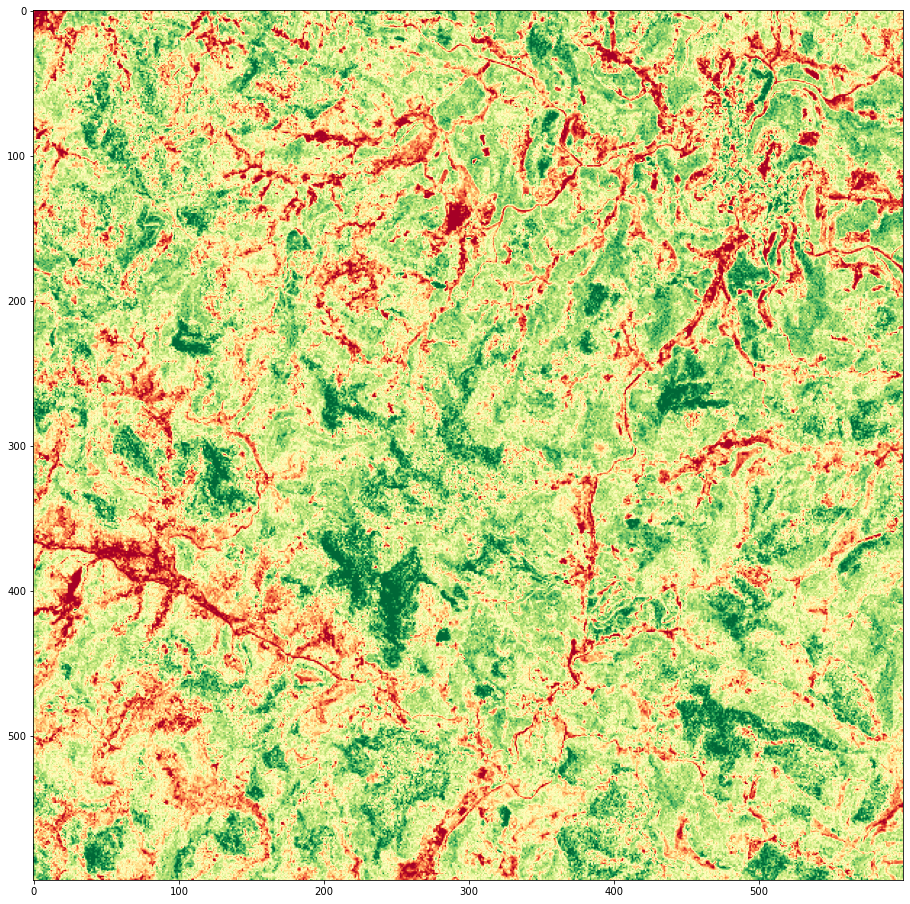

In [11]:
#Plotando spri com histograma expandido.
imshow(spri[4000:4600,2600:3200], stretch=(0.02,0.98), cmap='RdYlGn')

ImageView object:
  Display bands       :  [0]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.08701226577707916, 0.32123845193508116]
    G: [0.08701226577707916, 0.32123845193508116]
    B: [0.08701226577707916, 0.32123845193508116]

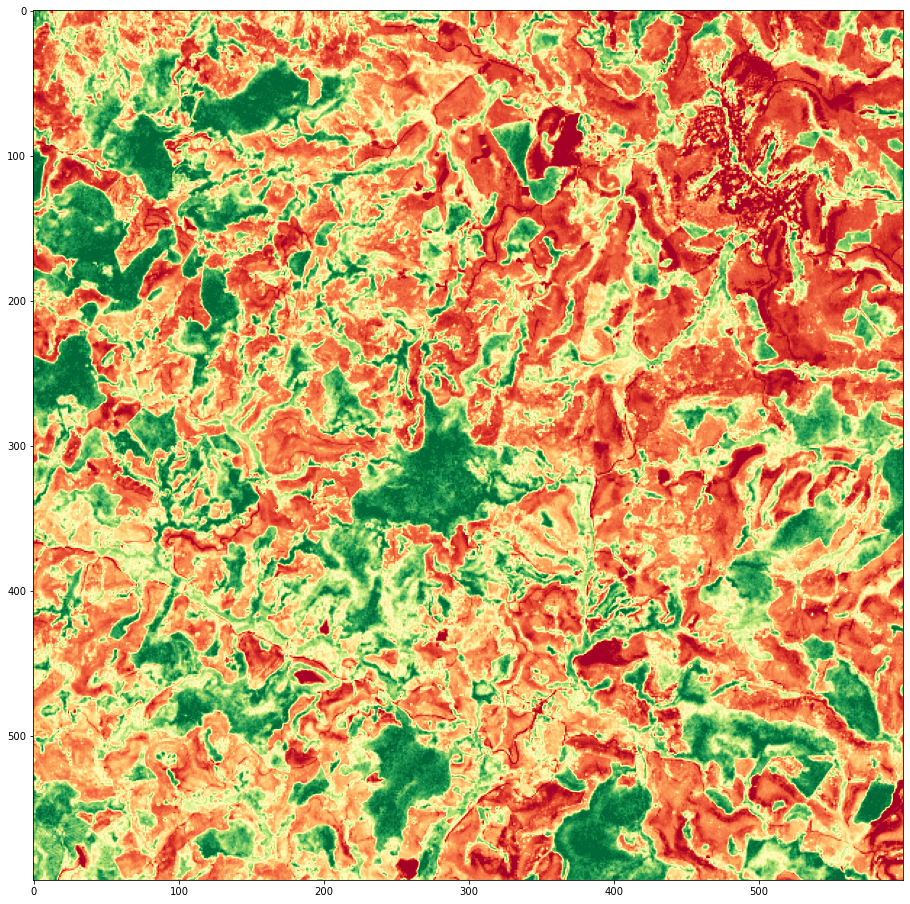

In [12]:
#Plotando co2flux com histograma expandido.
imshow(co2flux[4000:4600,2600:3200], stretch=(0.02,0.98), cmap='RdYlGn')